<h1 align="center"> Image Captioning With Attention</h1>

In this notebook you will teach network to use attention during captioning images.

Here is what we need to do:
1. Take pretrained VGG19 to build feature vectors for positions of images.
2. Stack LSTM with attention on top of that.
3. Train the model, draw attention maps.

This assignment is based on Alexander Panin's captioning assignment (https://github.com/yandexdataschool/Practical_DL/blob/spring2019/homework04/homework04_basic_part2_image_captioning.ipynb) and on the paper "Show, Attend and Tell" (https://arxiv.org/abs/1502.03044).

In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '3'

In [ ]:
# https://drive.google.com/file/d/1h0YOBZjy6a5YpoXNSiZv4RbL3uu54lQA/view?usp=share_link
# https://drive.google.com/file/d/1oAf8WBqBAPhYaZK6Ua0OKneOHpexOI9f/view?usp=sharing
# https://drive.google.com/file/d/1yO54Y19e-ClrpjeyvYWBfpL02wr3SmAu/view?usp=share_link

In [14]:
!gdown https://drive.google.com/uc?id=1yO54Y19e-ClrpjeyvYWBfpL02wr3SmAu -O /mnt/ssd1/datasets/captions/img_codes.hdf5

Downloading...
From: https://drive.google.com/uc?id=1yO54Y19e-ClrpjeyvYWBfpL02wr3SmAu
To: /mnt/ssd1/datasets/captions/img_codes.hdf5
100%|██████████████████████████████████████| 19.6G/19.6G [03:42<00:00, 88.2MB/s]


In [2]:
!pip install h5py gdown

In [3]:
!pip install matplotlib tqdm

In [4]:
import json

In [5]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [6]:
from tqdm import tqdm
import h5py

In [7]:
# you may need to install h5py, tqdm
#!pip install h5py tqdm
import sys
!{sys.executable} -m pip install h5py tqdm

## Data structure

To save your time, we've already vectorized all MSCOCO17 images with a pre-trained VGG19 network from [torchvision](https://github.com/pytorch/vision/blob/master/torchvision/models/vgg.py).

The whole process takes anywhere between a day on CPU and 30min on 1x GeForce GTX 1060. If you want to play with that yourself, [you're welcome](https://github.com/nadiinchi/dl_labs/blob/master/ht_attention_preprocess_data.ipynb).

Please either download data from [here](https://yadi.sk/d/KGh1SngBWH4stg) or generate it manually using the above script.

In [8]:
f = h5py.File('/mnt/ssd1/datasets/captions/img_codes.hdf5', 'r')
img_codes = f['data']

In [9]:
captions = json.load(open('/mnt/ssd1/datasets/captions/captions.json'))

In [10]:
print("Each image code is a 512x9x9-unit tensor [ shape: %s x %s ]" % (str(len(img_codes)), str(img_codes[0].shape)))
print(img_codes[0][:3].round(2), end='\n\n')
print("For each image there are 5 reference captions, e.g.:\n")
print('\n'.join(captions[0]))

Each image code is a 512x9x9-unit tensor [ shape: 118287 x (512, 9, 9) ]
[[[0.   0.   0.   0.   0.07 0.69 0.   0.   0.  ]
  [0.   0.24 0.   0.   0.63 1.94 1.21 0.72 0.46]
  [0.77 0.76 0.   0.   0.   0.88 1.65 2.37 1.14]
  [0.21 0.   0.   0.   2.8  3.3  2.93 6.29 3.48]
  [0.   0.   0.   0.   3.29 3.81 2.24 2.76 0.01]
  [0.   0.   0.   1.18 0.32 0.08 0.   0.   0.  ]
  [1.02 1.76 0.89 1.77 0.   0.   0.   0.   0.  ]
  [0.   1.36 0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.   0.09 0.3  0.  ]]

 [[0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.17 0.   0.   0.   0.   0.  ]
  [0.   0.95 0.   0.   0.   0.   0.   0.   0.  ]
  [0.34 1.5  0.   0.   0.36 0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.23 0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.52 0.   0.   0.  ]
  [0.   0.34 0.   0.   0.   0.   0.86 0.34 0.  ]
  [0.   0.47 0.26 0.41 0.   0.   1.08 0.38 0.  ]]

 [[1.09 3.03 2.15 0.65 0.   0.   1.06 0.2

As you can see, all captions are already tokenized and lowercased. We now want to split them and add some special tokens for start/end of caption.

In [11]:
#split descriptions into tokens
for img_i in range(len(captions)):
    for caption_i in range(len(captions[img_i])):
        sentence = captions[img_i][caption_i] 
        captions[img_i][caption_i] = ["#START#"]+sentence.split(' ')+["#END#"]

You don't want your network to predict a million-size vector of probabilities at each step, so we're gotta make some cuts. 

We want you to __count the occurences of each word__ so that we can decide which words to keep in our vocabulary.

In [12]:
# Build a Vocabulary
from collections import Counter
word_counts = Counter()

#Compute word frequencies for each word in captions. See code above for data structure
# <YOUR CODE HERE>
for img_i in range(len(captions)):
    for caption_i in range(len(captions[img_i])):
        word_counts.update(captions[img_i][caption_i] )

In [13]:
word_counts.most_common(10)

[('a', 978125),
 ('#START#', 591435),
 ('#END#', 591435),
 ('.', 444651),
 ('on', 215537),
 ('of', 203940),
 ('the', 197668),
 ('in', 183933),
 ('with', 154705),
 ('and', 140709)]

In [14]:
vocab  = ['#UNK#', '#START#', '#END#', '#PAD#']
vocab += [k for k, v in word_counts.items() if v >= 5 if k not in vocab]
n_tokens = len(vocab)

assert 10000 <= n_tokens <= 10500

word_to_index = {w: i for i, w in enumerate(vocab)}

In [15]:
eos_ix = word_to_index['#END#']
unk_ix = word_to_index['#UNK#']
pad_ix = word_to_index['#PAD#']

def as_matrix(sequences, max_len=None):
    """ Convert a list of tokens into a matrix with padding """
    max_len = max_len or max(map(len,sequences))
    
    matrix = np.zeros((len(sequences), max_len), dtype='int32') + pad_ix
    for i,seq in enumerate(sequences):
        row_ix = [word_to_index.get(word, unk_ix) for word in seq[:max_len]]
        matrix[i, :len(row_ix)] = row_ix
    
    return matrix

In [16]:
#try it out on several descriptions of a random image
print(captions[1488])
print(as_matrix(captions[1488]).shape)
as_matrix(captions[1488])

[['#START#', 'a', 'person', 'carrying', 'a', 'surfboard', 'on', 'top', 'of', 'a', 'parking', 'lot', '.', '#END#'], ['#START#', 'two', 'people', 'are', 'walking', 'in', 'a', 'parking', 'lot', 'holding', 'surfboards', '.', '#END#'], ['#START#', 'two', 'people', 'with', 'surfboards', 'are', 'standing', 'in', 'a', 'sandy', 'parking', 'lot', '.', '#END#'], ['#START#', 'the', 'surfers', 'are', 'carrying', 'their', 'boards', 'from', 'the', 'lot', 'to', 'the', 'beach', '.', '#END#'], ['#START#', 'this', 'is', 'a', 'man', 'walking', 'down', 'a', 'dirt', 'path', '#END#']]
(5, 15)


array([[   1,   14,  287,  163,   14, 1287,   62,   44,    5,   14,  213,
         222,   13,    2,    3],
       [   1,   53,  159,   24,  343,   18,   14,  213,  222,   33, 1128,
          13,    2,    3,    3],
       [   1,   53,  159,   27, 1128,   24,   46,   18,   14,  621,  213,
         222,   13,    2,    3],
       [   1,   43, 2128,   24,  163,  143,  520,   42,   43,  222,   57,
          43,  622,   13,    2],
       [   1,  118,   16,   14,  242,  343,   83,   14,  426,  613,    2,
           3,    3,    3,    3]], dtype=int32)

## Building our neural network

As we mentioned earlier, we shall build an rnn "language-model" conditioned on the features from the convolutional part. 

We'll unbox the inception net later to save memory, for now just pretend that it's available.

In [17]:
import torch, torch.nn as nn
import torch.nn.functional as F

### Attention

There are $K$ objects that you can pay attention to.
Each object is characterized by the key $k_i$ and the value $v_i$.
The attention layer proceeds queries.
For the query $q$, the layer returns a weighted sum of the values of the objects, with weights proportional to the degree of key matching the query:
$$w_i = \frac{\exp(score(q, k_i))}{\sum_{j=1}^K\exp(score(q, k_j))}$$
$$a = \sum_{i=1}^K w_i v_i$$

Here we use $score(q, k) = \frac{q^Tk}{\sqrt{dim(k)}}$, where $dim(k)$ is the dimensionality of the key (which also equals the dimensionality of the query).
For more information see the paper Vaswani et al. "Attention Is All You Need", 2017.

_Hint:_ It is recommended to pay attention to the function torch.bmm, it may be useful below.

#### Score function layer

In [18]:
class ScaledDotProductScore(nn.Module):
    """
    Vaswani et al. "Attention Is All You Need", 2017.
    """
    def __init__(self):
        super().__init__()

    def forward(self, queries, keys):
        """
        queries:  [batch_size x num_queries x dim]
        keys:     [batch_size x num_objects x dim]
        Returns a tensor of scores with shape [batch_size x num_queries x num_objects].
        """
        # PyTorch tensor built-in operations
        # https://pytorch.org/docs/stable/tensors.html
        # <YOUR CODE HERE>
        result = queries.bmm(keys.permute(0, 2, 1)) / (queries.shape[2]) ** 0.5
        return result

Test for ScaledDotProductScore

In [19]:
q = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 1, 0, 0],
    [1, 0, 0, 0, 0],
]], dtype=torch.float32)
o = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 0, 1, 0],
    [0, 0, 1, 0, 0],
    [0, 1, 0, 0, 0],
]], dtype=torch.float32)
print(ScaledDotProductScore()(q, o))

tensor([[[0.4472, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.4472, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000]]])


#### Attention layer

In [20]:
class Attention(nn.Module):
    def __init__(self, scorer):
        super().__init__()
        self.scorer = scorer

    def forward(self, queries, keys, values):
        """
        queries:         [batch_size x num_queries x query_feature_dim]
        keys:            [batch_size x num_objects x key_feature_dim]
        values:          [batch_size x num_objects x obj_feature_dim]
        Returns matrix of responses for queries with shape [batch_size x num_queries x obj_feature_dim].
        Saves detached weights as self.attention_map.
        """
        # Softmax numerical stability
        # https://ogunlao.github.io/2020/04/26/you_dont_really_know_softmax.html
        # Instead of implementing numerically stable softmax, use pytorch!
        scores = self.scorer(queries, keys) # (b, num_queries, num_objects)
        ib, iq, ik = scores.shape
        softmax = F.softmax(scores.view(ib*iq, ik), dim=1).view(ib, iq, ik)
        weights = softmax.unsqueeze(-1) * values.unsqueeze(1) # insert dimension: (b, 1, K, value_dim) * (b, Q, K, 1)
        weights = weights.sum(dim=2) # (b, Q, K, value_dim)
        self.attention_map = softmax # (b, Q, K)
        # <YOUR CODE HERE>
        result = weights
        return result

Tests for Attention layer

In [21]:
attn = Attention(ScaledDotProductScore())

In [22]:
q = torch.randn(2, 3, 5)
k = torch.randn(2, 4, 5)
v = torch.randn(2, 4, 7)
assert attn(q, k, v).shape == (2, 3, 7)

In [23]:
q = torch.tensor([[
    [0.01],
    [1],
    [100],
]], dtype=torch.float32)
o = torch.tensor([[
    [-1],
    [0],
    [1],
]], dtype=torch.float32) * 1000
a = attn(q, o, o)
assert torch.isnan(attn.attention_map).sum() == 0
assert torch.isnan(a).sum() == 0

In [24]:
q = torch.tensor([[
    [0, 1],
    [1, 0],
]], dtype=torch.float32)
k = torch.tensor([[
    [0, 0],
    [0, 1],
    [1, 0],
]], dtype=torch.float32)
v = torch.tensor([[
    [0],
    [1],
    [2],
]], dtype=torch.float32)
a = attn(q, k, v)
print('Attention map:\n', attn.attention_map)
print('Responses:\n', a)

Attention map:
 tensor([[[0.2483, 0.5035, 0.2483],
         [0.2483, 0.2483, 0.5035]]])
Responses:
 tensor([[[1.0000],
         [1.2552]]])


### Language model

In [25]:
class CaptionNet(nn.Module):
    def __init__(self, n_tokens=n_tokens, emb_size=128, lstm_units=256, cnn_channels=512):
        """ A recurrent 'head' network for image captioning. Read scheme below. """
        super(self.__class__, self).__init__()
        
        # a layer that converts conv features to 
        self.cnn_to_h0 = nn.Linear(cnn_channels, lstm_units)
        self.cnn_to_c0 = nn.Linear(cnn_channels, lstm_units)
        
        # recurrent part, please create the layers as per scheme above.

        # create embedding for input words. Use the parameters (e.g. emb_size).
        #self.emb = nn.Sequential(
        #    nn.Linear(n_tokens, emb_size*2),
        #    nn.ReLU(),
        #    nn.Linear(emb_size*2, emb_size),
        #)# <YOUR CODE> 
        self.emb2 = nn.Embedding(n_tokens, emb_size)
            
        # attention: create attention over image spatial positions
        # The query is previous lstm hidden state, the keys are transformed cnn features,
        # the values are cnn features
        self.attention = Attention(ScaledDotProductScore()) # <YOUR CODE>
        
        # attention: create transform from cnn features to the keys
        # Hint: one linear layer shoud work
        # Hint: the dimensionality of keys should be lstm_units as lstm
        #       hidden state is the attention query
        self.cnn_to_attn_key = nn.Linear(cnn_channels, lstm_units) # <YOUR CODE>
                
        # lstm: create a recurrent core of your network. Use LSTMCell
        self.lstm = nn.LSTMCell(emb_size+cnn_channels, lstm_units) # <YOUR CODE>

        # create logits: MLP that takes attention response, lstm hidden state
        # and the previous word embedding as an input and computes one number per token
        # Hint: I used an architecture with one hidden layer, but you may try deeper ones
        #self.logits_mlp = nn.Linear(, ) # <YOUR CODE>
        chan = lstm_units + cnn_channels + emb_size
        self.logits_mlp = nn.Sequential(
            nn.Linear(lstm_units + cnn_channels + emb_size, n_tokens),
            nn.ReLU(),
            nn.Linear(n_tokens, n_tokens),
            nn.ReLU(),
            nn.Linear(n_tokens, n_tokens)
        )

        print("Logits mlp", lstm_units + cnn_channels + emb_size)
        
    def forward(self, image_features, captions_ix):
        """ 
        Apply the network in training mode. 
        :param image_features: torch tensor containing VGG features for each position.
                               shape: [batch, cnn_channels, width * height]
        :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i]. 
            padded with pad_ix
        :returns: logits for next token at each tick, shape: [batch, word_i, n_tokens]
        """
        # About LSTM
        # https://colah.github.io/posts/2015-08-Understanding-LSTMs/
        ib, cnn_channels, pixels = image_features.shape
        initial_cell = self.cnn_to_c0(image_features.mean(2)) # (b, lstm_units)
        initial_hid = self.cnn_to_h0(image_features.mean(2)) # (b, lstm_units)
        
        image_features = image_features.transpose(1, 2).contiguous()
        
        # compute embeddings for captions_ix
        # Expand embedding to size of vocabulary, then shrink via linear layer
        ib, caption_length = captions_ix.shape
        #captions_emb = F.one_hot(captions_ix.flatten(), num_classes=n_tokens).float() # (b, caption_l) -> (b*caption_l, n_tokens)
        #captions_emb = self.emb(captions_emb).view(ib, caption_length, -1) # <YOUR CODE>
        captions_emb = self.emb2(captions_ix.flatten()).view(ib, caption_length, -1)
        # (b, caption_length, emb_size)
        
        attention_map = []
        recurrent_out = []
        
        # apply recurrent layer to captions_emb.
        # 1. initialize lstm state with initial_* from above
        cell_state = initial_cell
        hid_state = initial_hid
        # 2. In the recurrent loop over tokens:
        #   2.1. transform image vectors to the keys for attention
        image_key = self.cnn_to_attn_key(image_features.view(ib*pixels, cnn_channels)).view(ib, pixels, -1)
        # (b, pixels, lstm_units)
        for lstm_step in range(caption_length):
            #   2.2. use previous lstm state as an attention query and image vectors as values
            #   2.3. apply attention to obtain context vector
            # query, key, value: q(b, Q, key_dim), k(b, K, key_dim), v(b, K, value_dim)
            context = self.attention(hid_state.unsqueeze(1), image_key, image_features).squeeze(1) # (b, Q, cnn_channels)
            #   2.4. store attention map
            attention_map.append(self.attention.attention_map) # -> (b, 1, pixels)
            
            #   2.5. feed lstm with current token embedding concatenated with context vector
            #   2.6. update lstm hidden and cell vectors
            # GT input is fed into LSTM, not LSTM's output
            lstm_input = torch.cat([captions_emb[:, lstm_step, :], context], dim=1)
            hid_state, cell_state = self.lstm(lstm_input, (hid_state, cell_state))
            
            #   2.7. store current lstm hidden state, attention response, and the previous word embedding
            out = torch.cat([hid_state, context, captions_emb[:, lstm_step]], dim=1)
            recurrent_out.append(out.unsqueeze(1)) # -> (b, 1, lstm_units + cnn_channels + emb_size)
        # reccurent_out should be lstm hidden state sequence
        # of shape [batch, caption_length, lstm_units + cnn_channels + emb_size]
        # attention_map should be attention maps sequence
        # of shape [batch, caption_length, width * height]
        recurrent_out = torch.cat(recurrent_out, dim=1) # <YOUR_CODE>
        attention_map = torch.cat(attention_map, dim=1) # <YOUR CODE>
        
        # print("Recurrent out", recurrent_out.shape)
        
        # compute logits for next token probabilities
        # based on the stored in (2.7) values (reccurent_out)
        logits = self.logits_mlp( recurrent_out.view(ib*caption_length, -1) ).view(ib, caption_length, -1) # <YOUR_CODE>
        
        # return logits and attention maps from (2.4)
        return logits, attention_map

In [26]:
network = CaptionNet(n_tokens)

Logits mlp 896


In [27]:
dummy_img_vec = torch.randn(len(captions[0]), 512, 81)
dummy_capt_ix = torch.tensor(as_matrix(captions[0]), dtype=torch.int64)

dummy_logits, dummy_attention_map = network.forward(dummy_img_vec, dummy_capt_ix)
dummy_logits, dummy_attention_map = network.forward(dummy_img_vec, dummy_capt_ix)

print('logits shape:', dummy_logits.shape)
print('attention map shape:', dummy_attention_map.shape)
assert dummy_logits.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], n_tokens)
assert dummy_attention_map.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], 81)

logits shape: torch.Size([5, 14, 10403])
attention map shape: torch.Size([5, 14, 81])


#### Train loss function

In [28]:
def compute_loss(network, image_features, captions_ix):
    """
    :param image_features: torch tensor containing VGG features. shape: [batch, cnn_channels, width * height]
    :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i]. 
        padded with pad_ix
    :returns: crossentropy (neg llh) loss for next captions_ix given previous ones plus 
              attention regularizer. Scalar float tensor
    """
    
    if next(network.parameters()).is_cuda:
        image_features, captions_ix = image_features.cuda(), captions_ix.cuda()
    
    # captions for input - all except last cuz we don't know next token for last one.
    captions_ix_inp = captions_ix[:, :-1].contiguous()
    captions_ix_next = captions_ix[:, 1:].contiguous()
    
    # apply the network, get predictions, attnetion map and gates for captions_ix_next
    logits_for_next, attention_map = network.forward(image_features, captions_ix_inp)
    
    
    # compute the loss function between logits_for_next and captions_ix_next
    # Use the mask, Luke: make sure that predicting next tokens after EOS do not contribute to loss
    # you can do that either by multiplying elementwise loss by (captions_ix_next != pad_ix)
    # or by using ignore_index in some losses.
    
    # https://pytorch.org/docs/stable/generated/torch.nn.CrossEntropyLoss.html
    ib, caption_length = logits_for_next.shape[:2] # (b, caption_length, n_tokens)
    logits_pred = logits_for_next.view(ib*caption_length, n_tokens)
    target = captions_ix_next.flatten()
    loss = nn.CrossEntropyLoss(reduce="none")(logits_pred, target) # ->(ib*caption_l) # <YOUR CODE>
    loss = (loss * (target != pad_ix).float()).mean()

    # the regularizer for attention - this one requires the attention over each position to sum up to 1,
    # i. e. to look at the whole image during sentence generation process
    mask = (captions_ix_inp != pad_ix)
    masked_attention_map = attention_map * mask[:, :, None].float()
    regularizer = ((1 - masked_attention_map.sum(1)) ** 2).mean()
    
    return loss + regularizer

In [29]:
dummy_loss = compute_loss(network, dummy_img_vec, dummy_capt_ix)

assert len(dummy_loss.shape) <= 1, 'loss must be scalar'
assert dummy_loss.detach().cpu().numpy() > 0, "did you forget the 'negative' part of negative log-likelihood"

dummy_loss.backward()

assert all(param.grad is not None for param in network.parameters()), \
        'loss should depend differentiably on all neural network weights'

/home/maxvel/miniconda3/envs/pytorch/lib/python3.9/site-packages/torch/nn/_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='mean' instead.
  warnings.warn(warning.format(ret))


#### Optimizer
Create ~~adam~~ your favorite optimizer for the network.

In [30]:
optimizer = torch.optim.Adam(network.parameters(), lr=1e-5) # <YOUR CODE>

# Training

* First make train/val split without extra memory usage
* Implement the batch generator
* Than train the network as usual

In [31]:
from torch.utils.data import Dataset

class IdxDataset(Dataset):
    def __init__(self, dataset, idx):
        self.dataset = dataset
        self.idx = idx
    
    def __len__(self):
        return len(self.idx)
        
    def __getitem__(self, idx):
        return self.dataset[self.idx[idx]]

In [32]:
captions = np.array(captions)

np.random.seed(42)
perm = np.random.permutation(len(img_codes))
threshold = round(len(img_codes) * 0.1)
train_img_idx, val_img_idx = perm[threshold:], perm[: threshold]

train_img_idx.sort()
val_img_idx.sort()
train_img_codes = IdxDataset(img_codes, train_img_idx)
val_img_codes = IdxDataset(img_codes, val_img_idx)
train_captions = IdxDataset(captions, train_img_idx)
val_captions = IdxDataset(captions, val_img_idx)

/tmp/ipykernel_1944717/2624119931.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  captions = np.array(captions)


In [33]:
from random import choice

last_batch_end = {}

def generate_batch(img_codes, captions, batch_size, max_caption_len=None):
    
    #sample sequential numbers for image/caption indicies (for trainign speed up)
    global last_batch_end
    random_image_ix = np.arange(batch_size, dtype='int') + last_batch_end.get(len(img_codes), 0)
    last_batch_end[len(img_codes)] = last_batch_end.get(len(img_codes), 0) + batch_size
    if last_batch_end[len(img_codes)] + batch_size >= len(img_codes):
        last_batch_end[len(img_codes)] = 0
    
    #get images
    batch_images = np.vstack([img_codes[i][None] for i in random_image_ix])
    batch_images = batch_images.reshape(batch_images.shape[0], batch_images.shape[1], -1)
    
    #5-7 captions for each image
    captions_for_batch_images = captions[random_image_ix]
    
    #pick one from a set of captions for each image
    batch_captions = list(map(choice,captions_for_batch_images))
    
    #convert to matrix
    batch_captions_ix = as_matrix(batch_captions,max_len=max_caption_len)
    
    return torch.tensor(batch_images, dtype=torch.float32), torch.tensor(batch_captions_ix, dtype=torch.int64)

In [34]:
generate_batch(img_codes, captions, 3)

(tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.0941, 0.2962, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 1.0764, 0.3785, 0.0000],
          [1.0881, 3.0323, 2.1466,  ..., 0.9595, 1.1179, 0.9478],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
 
         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0711,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 1.1465, 1.6479, 1.6033]],
 
         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.3930, 0.9311],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ...,

### Main loop

Train on minibatches just as usual. Evaluate on val from time to time.

##### TIps
* If training loss has become close to 0 or model produces garbage,
    double-check that you're predicting __next__ words, not current or t+2'th words.
* If the model generates fluent captions that have nothing to do with the images
 * this may be due to recurrent net not receiving image vectors.
 * alternatively it may be caused by gradient explosion, try clipping 'em or just restarting the training
 * finally, you may just need to train the model a bit more


* Crossentropy is a poor measure of overfitting
 * Model can overfit validation crossentropy but keep improving validation quality.
 * Use human _(manual)_ evaluation or try automated metrics: [cider](https://github.com/vrama91/cider) or [bleu](https://www.nltk.org/_modules/nltk/translate/bleu_score.html)
 

* We recommend you to periodically evaluate the network using the next "apply trained model" block
 *  its safe to interrupt training, run a few examples and start training again
 
* The typical loss values should be around 3~5 if you average over time, scale by length if you sum over time. The reasonable captions began appearing at loss=3.5~3.7

In [35]:
torch.cuda.is_available()

True

In [36]:
torch.__version__

'1.12.1+cu102'

In [37]:
batch_size = 64*8  # adjust me
n_epochs = 100    # adjust me
n_batches_per_epoch = 64  # adjust me
n_validation_batches = 8  # how many batches are used for validation after each epoch

In [38]:
from tqdm import tqdm

for epoch in range(n_epochs):
    if torch.cuda.is_available():
        network = network.cuda()
   
    train_loss=0
    network.train(True)
    with tqdm(range(n_batches_per_epoch)) as iterator:
        for _ in iterator:
            optimizer.zero_grad()
            loss_t = compute_loss(network, *generate_batch(train_img_codes, train_captions, batch_size))
            loss_t.backward()
            optimizer.step()
            loss_t = loss_t.detach()
            
        
            # clear old gradients; do a backward pass to get new gradients; then train with opt
            # <YOUR CODE>
        
            train_loss += float(loss_t)
    train_loss /= n_batches_per_epoch
        
    val_loss=0
    network.train(False)
    for _ in range(n_validation_batches):
        loss_t = compute_loss(network, *generate_batch(val_img_codes, val_captions, batch_size))
        val_loss += float(loss_t)
    val_loss /= n_validation_batches
    
    if torch.cuda.is_available():
        network = network.cpu()

    print('\nEpoch: {}, train loss: {}, val loss: {}'.format(epoch, train_loss, val_loss), flush=True)

print("Finished!")

100%|███████████████████████████████████████████████████████████████████████████████████████| 64/64 [02:19<00:00,  2.17s/it]



Epoch: 0, train loss: 2.4426378663629293, val loss: 1.5900803953409195


100%|███████████████████████████████████████████████████████████████████████████████████████| 64/64 [02:30<00:00,  2.35s/it]



Epoch: 1, train loss: 1.53770683798939, val loss: 1.4326030910015106


100%|███████████████████████████████████████████████████████████████████████████████████████| 64/64 [02:27<00:00,  2.30s/it]



Epoch: 2, train loss: 1.5230660904198885, val loss: 1.3378175422549248


100%|███████████████████████████████████████████████████████████████████████████████████████| 64/64 [02:28<00:00,  2.32s/it]



Epoch: 3, train loss: 1.4788937233388424, val loss: 1.4650266617536545


100%|███████████████████████████████████████████████████████████████████████████████████████| 64/64 [02:29<00:00,  2.33s/it]



Epoch: 4, train loss: 1.4503446044400334, val loss: 1.539749190211296


100%|███████████████████████████████████████████████████████████████████████████████████████| 64/64 [02:37<00:00,  2.47s/it]



Epoch: 5, train loss: 1.3894825270399451, val loss: 1.2991480752825737


100%|███████████████████████████████████████████████████████████████████████████████████████| 64/64 [02:43<00:00,  2.56s/it]



Epoch: 6, train loss: 1.3469434659928083, val loss: 1.4437654912471771


100%|███████████████████████████████████████████████████████████████████████████████████████| 64/64 [02:31<00:00,  2.37s/it]



Epoch: 7, train loss: 1.4150818763300776, val loss: 1.438220128417015


100%|███████████████████████████████████████████████████████████████████████████████████████| 64/64 [02:35<00:00,  2.43s/it]



Epoch: 8, train loss: 1.3443687073886395, val loss: 1.3287353515625


100%|███████████████████████████████████████████████████████████████████████████████████████| 64/64 [02:26<00:00,  2.29s/it]



Epoch: 9, train loss: 1.4155227318406105, val loss: 1.4222867637872696


100%|███████████████████████████████████████████████████████████████████████████████████████| 64/64 [02:35<00:00,  2.43s/it]



Epoch: 10, train loss: 1.3161311727017164, val loss: 1.3722199201583862


100%|███████████████████████████████████████████████████████████████████████████████████████| 64/64 [02:30<00:00,  2.35s/it]



Epoch: 11, train loss: 1.36543202213943, val loss: 1.3809131756424904


100%|███████████████████████████████████████████████████████████████████████████████████████| 64/64 [02:37<00:00,  2.46s/it]



Epoch: 12, train loss: 1.3146030865609646, val loss: 1.448549523949623


100%|███████████████████████████████████████████████████████████████████████████████████████| 64/64 [02:31<00:00,  2.36s/it]



Epoch: 13, train loss: 1.343519201502204, val loss: 1.3705823123455048


100%|███████████████████████████████████████████████████████████████████████████████████████| 64/64 [02:37<00:00,  2.47s/it]



Epoch: 14, train loss: 1.290503442287445, val loss: 1.3783313482999802


100%|███████████████████████████████████████████████████████████████████████████████████████| 64/64 [02:38<00:00,  2.48s/it]



Epoch: 15, train loss: 1.2865946926176548, val loss: 1.2389253303408623


100%|███████████████████████████████████████████████████████████████████████████████████████| 64/64 [02:36<00:00,  2.45s/it]



Epoch: 16, train loss: 1.2854738431051373, val loss: 1.3814723044633865


100%|███████████████████████████████████████████████████████████████████████████████████████| 64/64 [02:39<00:00,  2.49s/it]



Epoch: 17, train loss: 1.29142932780087, val loss: 1.3373030424118042


100%|███████████████████████████████████████████████████████████████████████████████████████| 64/64 [02:35<00:00,  2.43s/it]



Epoch: 18, train loss: 1.2874289071187377, val loss: 1.1834423020482063


100%|███████████████████████████████████████████████████████████████████████████████████████| 64/64 [02:36<00:00,  2.44s/it]



Epoch: 19, train loss: 1.2749007707461715, val loss: 1.3435245007276535


100%|███████████████████████████████████████████████████████████████████████████████████████| 64/64 [02:34<00:00,  2.42s/it]



Epoch: 20, train loss: 1.2746658734977245, val loss: 1.2137727290391922


100%|███████████████████████████████████████████████████████████████████████████████████████| 64/64 [02:36<00:00,  2.44s/it]



Epoch: 21, train loss: 1.2983513539656997, val loss: 1.2475808262825012


100%|███████████████████████████████████████████████████████████████████████████████████████| 64/64 [02:40<00:00,  2.51s/it]



Epoch: 22, train loss: 1.251265716738999, val loss: 1.2769855260849


 80%|█████████████████████████████████████████████████████████████████████▎                 | 51/64 [02:10<00:33,  2.56s/it]


KeyboardInterrupt: 

### Apply trained model

Let's unpack our pre-trained VGG network and see what our model is capable of.

In [41]:
from torch import nn
import torch.nn.functional as F
from torchvision.models.vgg import VGG, cfgs as VGG_cfgs, make_layers
from warnings import warn
class BeheadedVGG19(VGG):
    """ Like torchvision.models.inception.Inception3 but the head goes separately """
    
    def forward(self, x):
        x_for_attn = x= self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        logits = x = self.classifier(x)
        return x_for_attn, logits
    
features_net = BeheadedVGG19(make_layers(VGG_cfgs['E'], batch_norm=False), init_weights=False)

from torch.utils.model_zoo import load_url
features_net_url = 'https://download.pytorch.org/models/vgg19-dcbb9e9d.pth'
features_net.load_state_dict(load_url(features_net_url))

features_net = features_net.train(False)
if torch.cuda.is_available():
    features_net = features_net.cuda()
features_net = nn.DataParallel(features_net)

### Generate caption

The function below creates captions by sampling from probabilities defined by the net.

The implementation used here is simple but inefficient (quadratic in lstm steps). We keep it that way since it isn't a performance bottleneck.

In [42]:
def generate_caption(image, caption_prefix = ("#START#",), 
                     t=1, sample=True, max_len=100):
    
    assert isinstance(image, np.ndarray) and np.max(image) <= 1\
           and np.min(image) >=0 and image.shape[-1] == 3
    
    image = torch.tensor(image.transpose([2, 0, 1]), dtype=torch.float32)
    
    vectors_9x9, logits = features_net(image[None])
    caption_prefix = list(caption_prefix)
    
    attention_maps = []
    
    for _ in range(max_len):
        
        prefix_ix = as_matrix([caption_prefix])
        prefix_ix = torch.tensor(prefix_ix, dtype=torch.int64)
        input_features = vectors_9x9.view(vectors_9x9.shape[0], vectors_9x9.shape[1], -1)
        if next(network.parameters()).is_cuda:
            input_features, prefix_ix = input_features.cuda(), prefix_ix.cuda()
        else:
            input_features, prefix_ix = input_features.cpu(), prefix_ix.cpu()
        next_word_logits, cur_attention_map = network(input_features, prefix_ix)
        next_word_logits = next_word_logits[0, -1]
        cur_attention_map = cur_attention_map[0, -1]
        next_word_probs = F.softmax(next_word_logits, -1).detach().cpu().numpy()
        attention_maps.append(cur_attention_map.detach().cpu())
        
        assert len(next_word_probs.shape) ==1, 'probs must be one-dimensional'
        next_word_probs = next_word_probs ** t / np.sum(next_word_probs ** t) # apply temperature

        if sample:
            next_word = np.random.choice(vocab, p=next_word_probs) 
        else:
            next_word = vocab[np.argmax(next_word_probs)]

        caption_prefix.append(next_word)

        if next_word=="#END#":
            break

    return caption_prefix, attention_maps

Here is the code which downloads image, prints different generated captions and visualize attention map.

In [43]:
from matplotlib import pyplot as plt
from skimage.transform import resize
from tempfile import mktemp
from os import remove
%matplotlib inline

# get and preprocess image
def obtain_image(filename=None, url=None):
    if (filename is None and url is None) or (filename is not None and url is not None):
        raise ValueError('You shoud specify either filename or url')
    if url is not None:
        tmpfilename = mktemp()
        !wget {url} -O {tmpfilename} -q
        img = plt.imread(tmpfilename)
        remove(tmpfilename)
    else:
        img = plt.imread(filename)
    img = resize(img, (299, 299), mode='wrap', anti_aliasing=True).astype('float32')
    return img

def show_img(img):
    plt.imshow(img)
    plt.axis('off')

def print_possible_captions(img, num_captions=10, temperature=5.):
    for i in range(num_captions):
        print(' '.join(generate_caption(img, t=temperature)[0][1:-1]))
        
def draw_attention_map(img, caption, attention_map):
    s = 4
    n = len(caption)
    w = 4
    h = n // w + 1
    plt.figure(figsize=(w * s, h * s))
    plt.subplot(h, w, 1)
    plt.imshow(img)
    plt.title('INPUT', fontsize=s * 4)
    plt.axis('off')
    for i, word, attention in zip(range(n), caption, attention_map):
        plt.subplot(h, w, 2 + i)
        attn_map = attention.view(1, 1, 9, 9)
        attn_map = F.interpolate(attn_map, size=(12, 12), mode='nearest')
        attn_map = F.interpolate(attn_map, size=(299, 299), mode='bilinear', align_corners=False)
        attn_map = attn_map[0, 0][:, :, None]
        attn_map = torch.min(attn_map / attn_map.max(), torch.ones_like(attn_map)).numpy()
        plt.imshow(img * attn_map)
        plt.title(word, fontsize=s * 4)
        plt.axis('off')

def process_image(img):
    print_possible_captions(img)
    c, am = generate_caption(img, t=5.)
    draw_attention_map(img, c[1:-1], am)

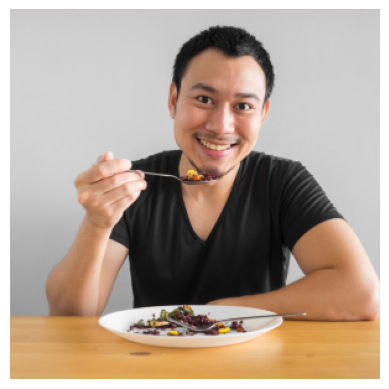

In [44]:
img = obtain_image(url="https://thecenterformindfuleating.org/resources/Pictures/asian%20man%20eating.jpg")
show_img(img)

In [45]:
network = network.cpu().eval()

a man is holding a table with a table .
a man is holding a man in a table .
a man in a woman holding a table with a table .
a man is holding a woman holding a table .
a man in a man with a table with a table .
a man holding a tennis player holding a table .
a man is holding a table with a table .
a man holding a table with a table with a table .
a man with a man holding a table with a table .
a man with a young boy in a table .


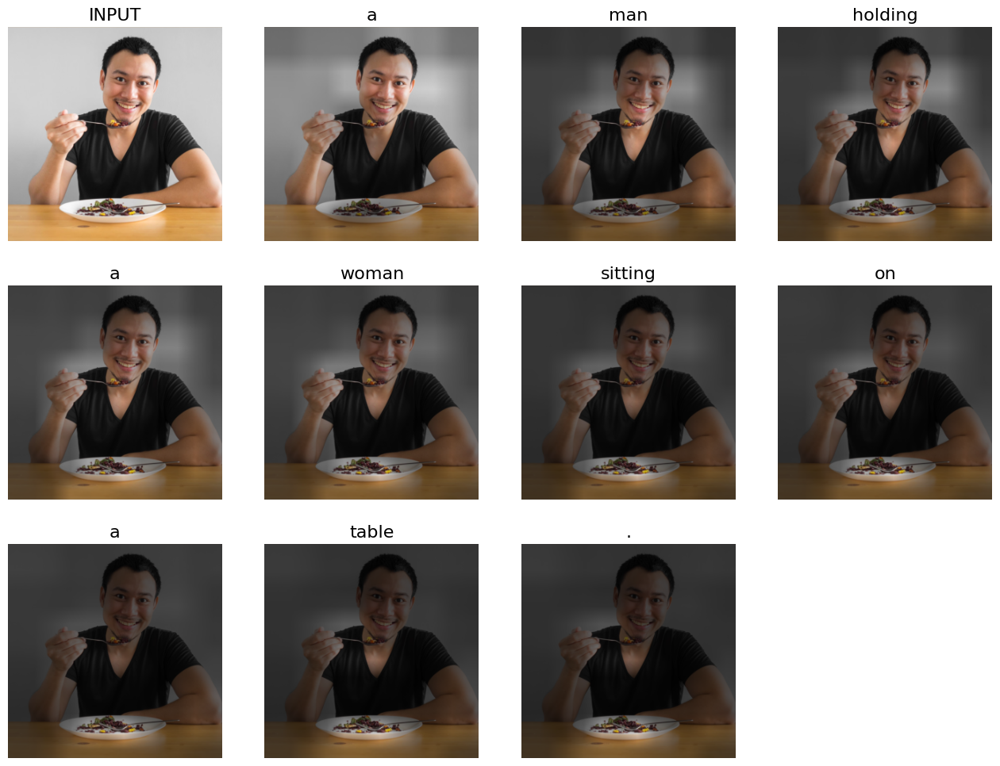

In [52]:
process_image(img)

a man riding a bike on a snowy hill .
a man riding a motorcycle on a bike .
a man riding a motorcycle on a road .
a man riding a bike on a snowy hill .
a man riding a bike on a snowy hill .
a man riding a motorcycle on a bike .
a man riding a bike on a road .
a man riding a bike riding a mountain
a man riding a motorcycle on a snowy hill .
a man riding a bike down a mountain .


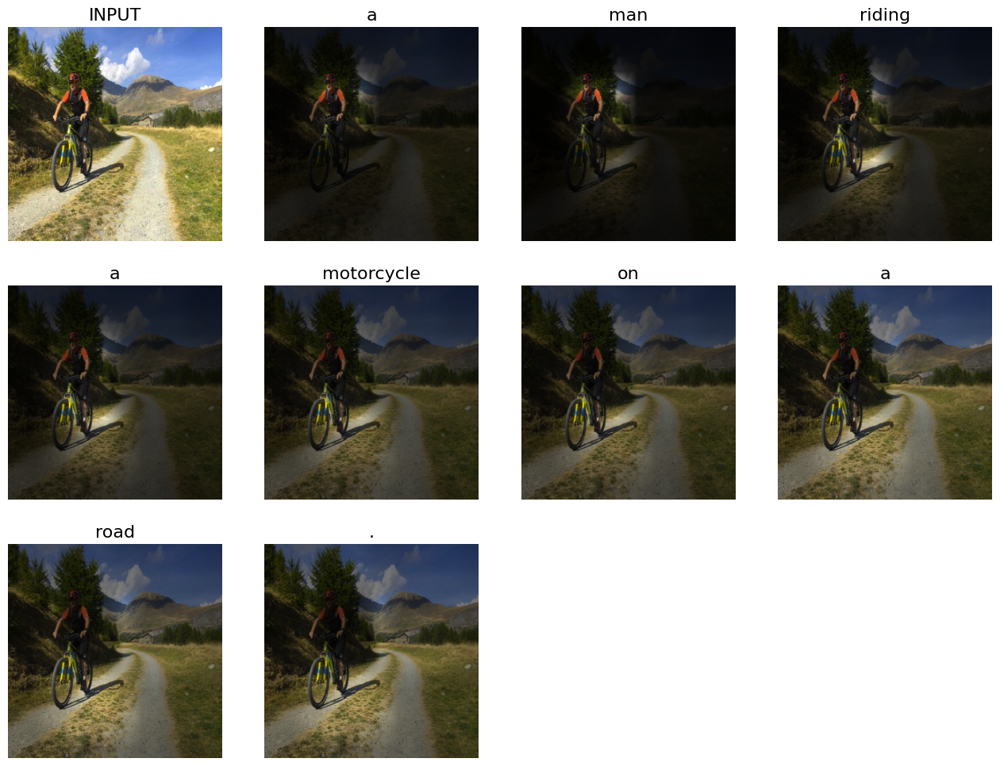

In [47]:
process_image(obtain_image(url="https://www.dimensioneattiva.it/wp-content/uploads/2016/10/Bike5.jpg"))

a cat laying on a cat laying on a cat .
a cat laying on top of a cat laying on a bed .
a cat laying on top of a brown dog .
a cat laying on a cat laying on a cat .
a cat laying on a cat laying on a cat .
a cat laying on top of a cat laying on a black cat .
a cat laying on a cat laying on top of a black cat .
a cat is laying on a cat laying on a cat .
a cat laying on a cat laying on a cat .
a cat laying down in a cat laying on a cat .


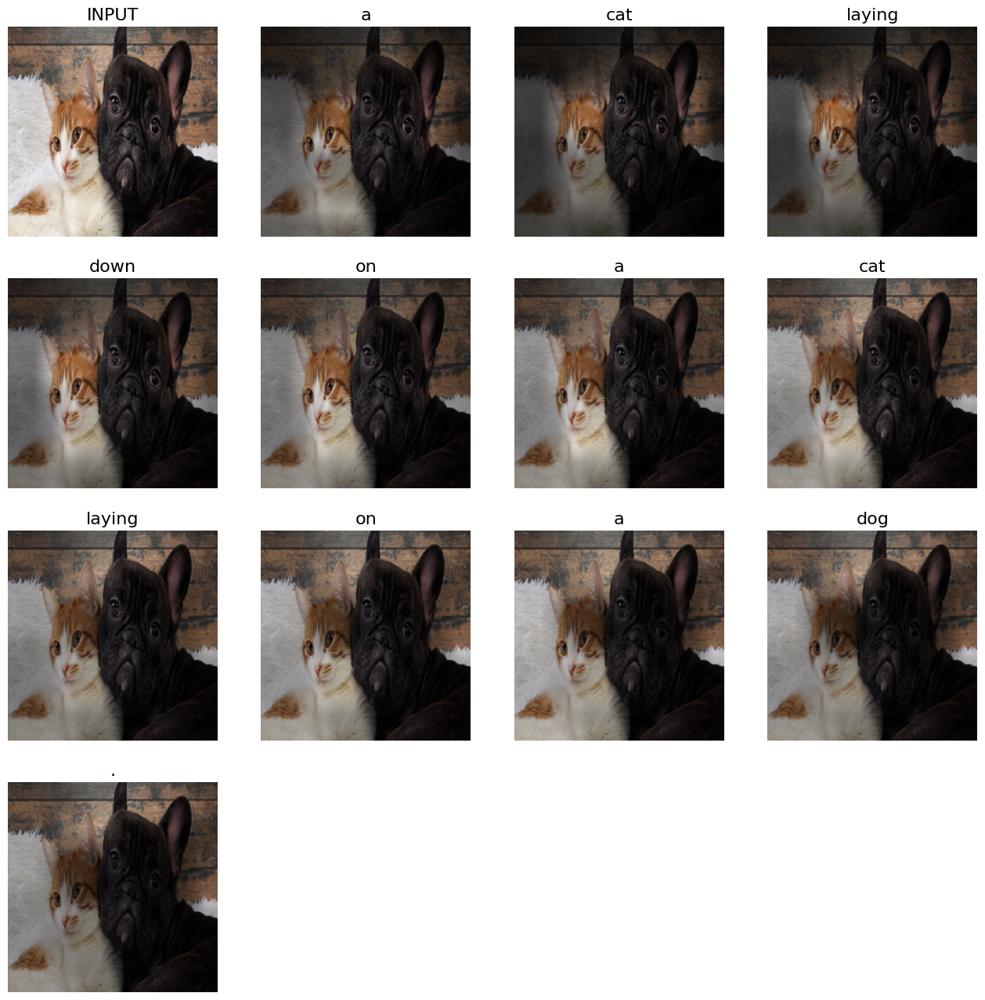

In [53]:
process_image(obtain_image(url="http://ccanimalclinic.com/wp-content/uploads/2017/07/Cat-and-dog-1.jpg"))

a man is a skateboard down a skateboard on a skateboard .
a man is a skateboard down a skateboard on a skateboard .
a man is a skateboard down a skateboard .
a man is a skateboard on a skateboard .
a man is a skateboard on a skateboard in the air .
a man is riding a skateboard on a skateboard .
a man is a skateboard down a skateboard .
a man with a baseball player in the air .
a man is riding a skateboard down the air .
a man is a tennis player in the air .


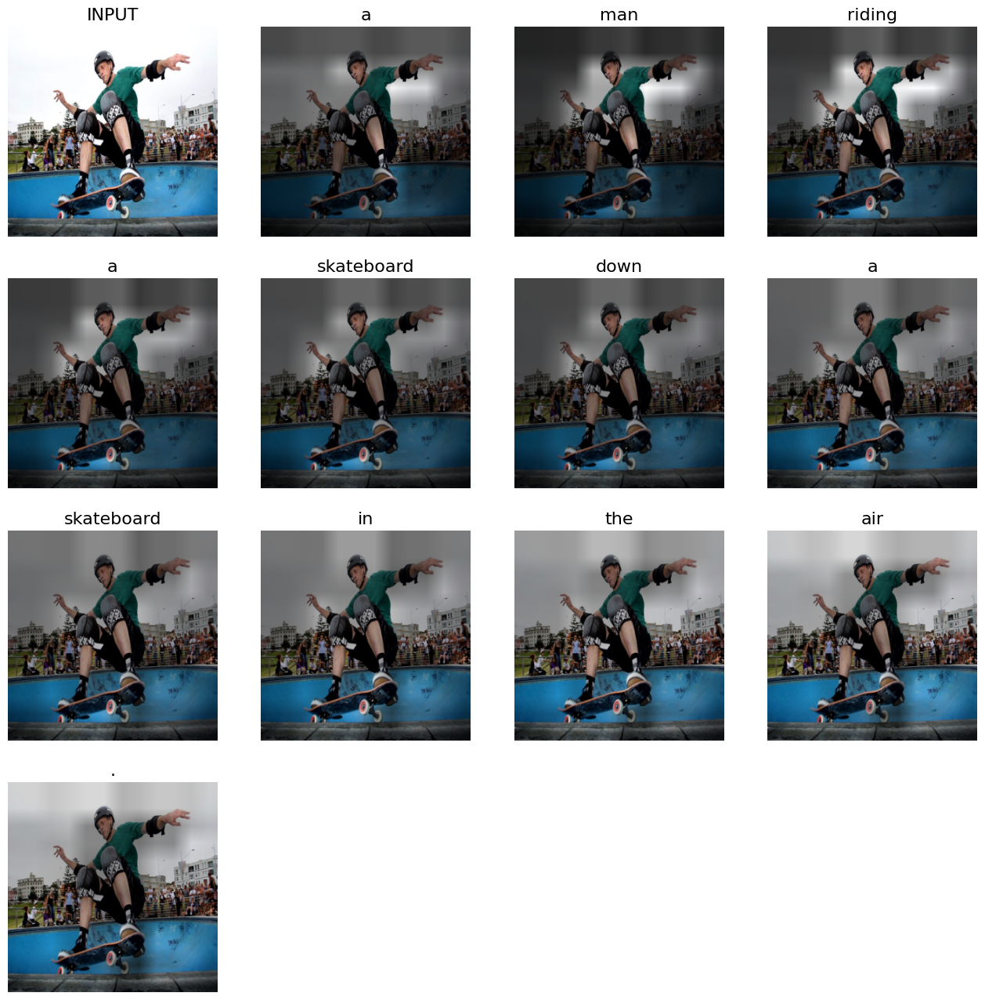

In [50]:
process_image(obtain_image(url="https://pixel.nymag.com/imgs/daily/selectall/2018/02/12/12-tony-hawk.w710.h473.jpg"))

# Demo
### Find at least 10 images to test it on.
* Seriously, that's part of an assignment. Go get at least 10 pictures to get captioned
* Make sure it works okay on __simple__ images before going to something more comples
* Photos, not animation/3d/drawings, unless you want to train CNN network on anime
* Mind the aspect ratio

In [ ]:
#apply your network on image sample you found
#
#

a cat is standing on a tree branch .
a cat is sitting on a cat laying on a tree .
a cat sitting on a cat that is standing on a tree .
a cat is standing on a black cat .
a cat is sitting on a skateboard .
a cat is standing on a cat laying on a tree .
a cat is sitting on a cat laying on a tree .
a cat sitting on a cat laying on a bench .
a cat is sitting on a cat laying on a bench .
a cat is sitting on a cat laying on a tree .


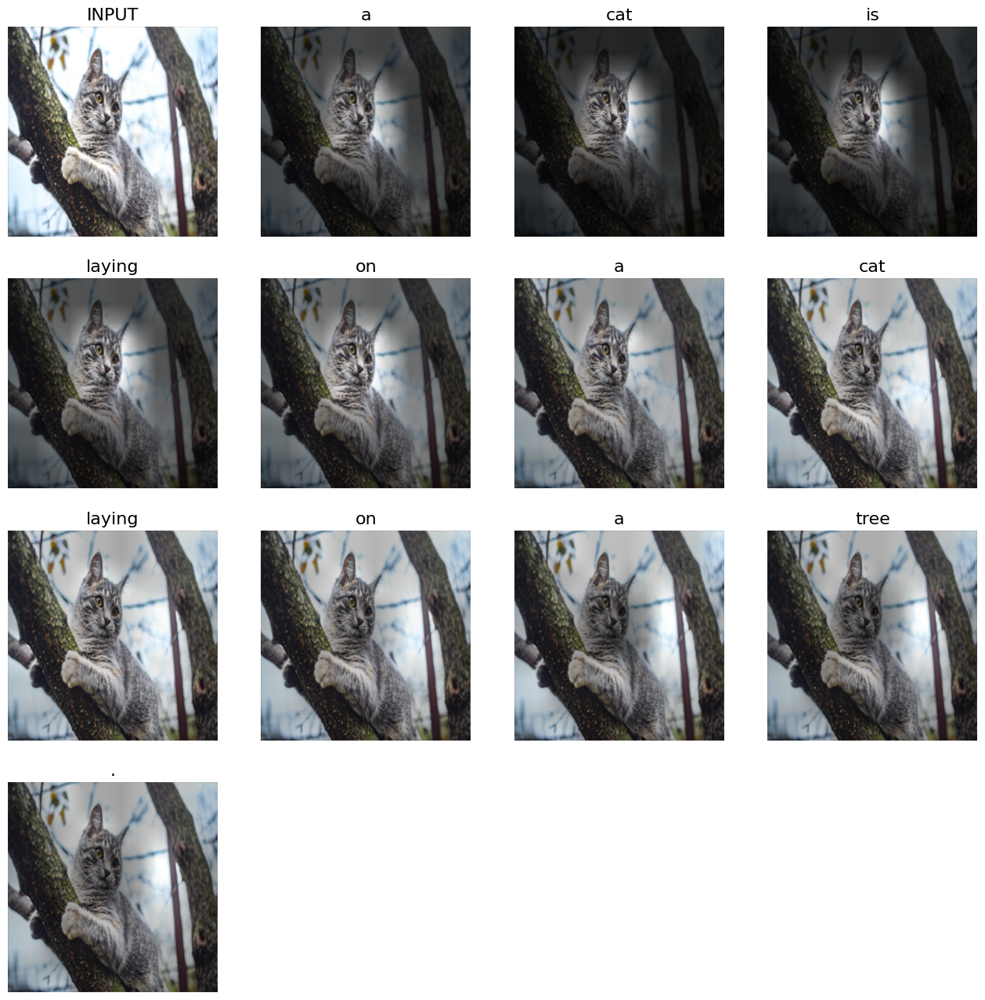

In [57]:
process_image(obtain_image(url="https://imagesvc.meredithcorp.io/v3/mm/image?url=https%3A%2F%2Fstatic.onecms.io%2Fwp-content%2Fuploads%2Fsites%2F47%2F2020%2F11%2F30%2Fcat-stuck-in-tree-298823311-2000.jpg"))

a group of people sitting at a table .
a group of people sitting at a table .
a group of people sitting at a table .
a man and a man holding a table with a table .
a man with a group of people sitting at a table .
a group of people are sitting on a table .
a group of people sitting at a table with a table .
a group of people sitting at a table with a table .
a group of people sitting at a table .
a group of people are sitting at a table .


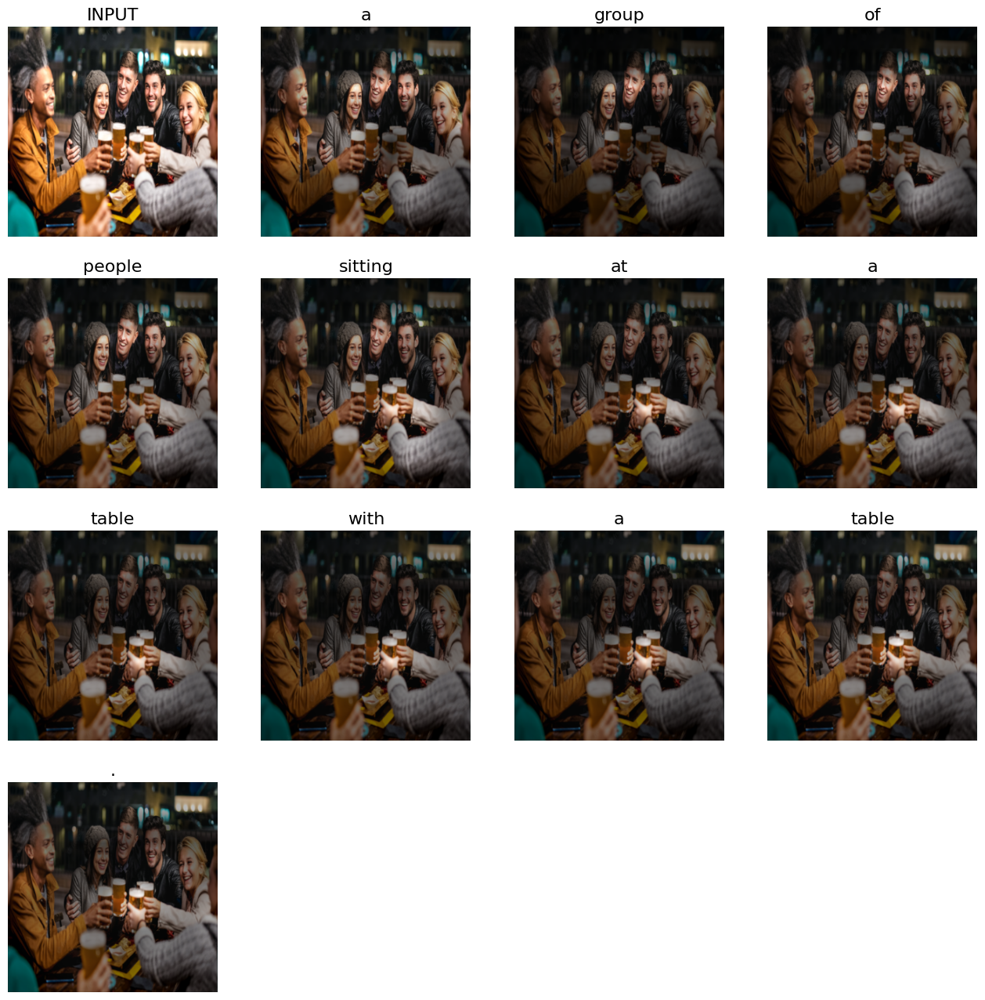

In [59]:
process_image(obtain_image(url="https://img.freepik.com/premium-photo/happy-friends-group-drinking-beer-brewery-bar-out-doors_101731-476.jpg?w=2000"))

a large white plate with a table with a table .
a person is a white plate with a table .
a large white plate with a table with a table .
a person is a table with a table with a bowl .
a small white plate with a table with a table .
a person is a table with a plate of a table .
a man is a table with a plate of food .
a close up of a plate with a table .
a white plate with a table with a plate .
a white plate of a table with a plate .


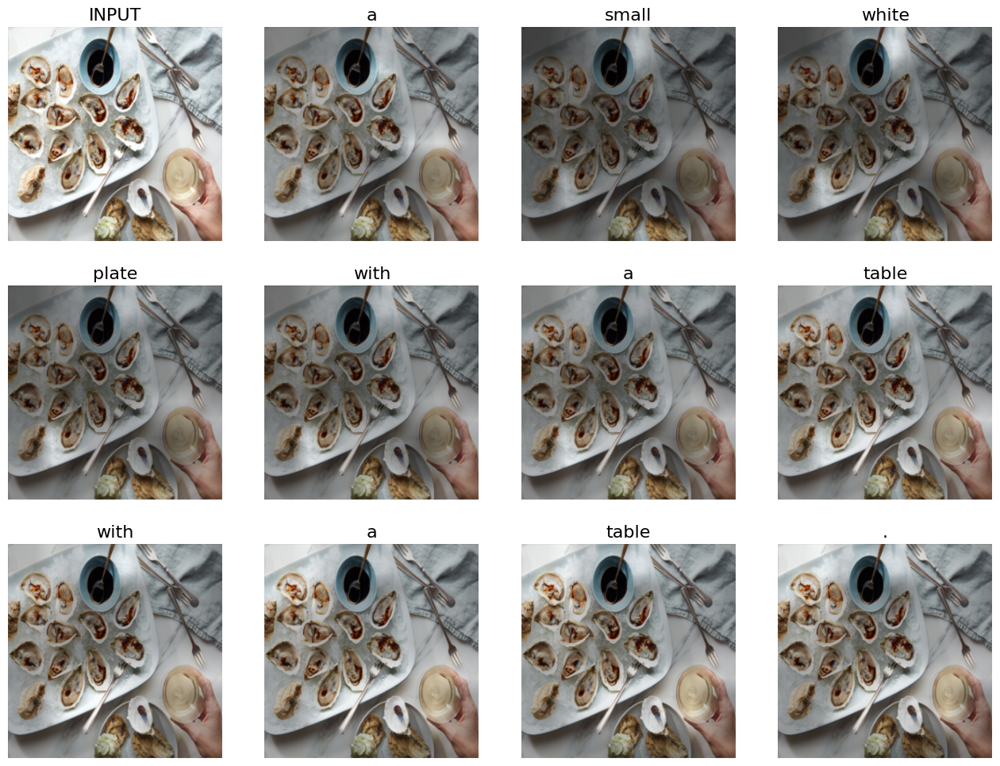

In [64]:
process_image(obtain_image(url="https://assets.epicurious.com/photos/5de56a5b6dbb460009bd57b8/4:3/w_4444,h_3333,c_limit/FreshOysters_Hand_112019_17003_V1_final.jpg"))

a man with a table with a table with a table .
a woman sitting at a table with a table .
a man is a table with a table and a table .
a woman sitting at a table with a table .
a woman sitting at a table with a table .
a woman sitting at a table with a table .
a man sitting at a table with a table .
a man and a woman holding a table with a table .
a man is a table with a table .
a man is a table with a table with a table .


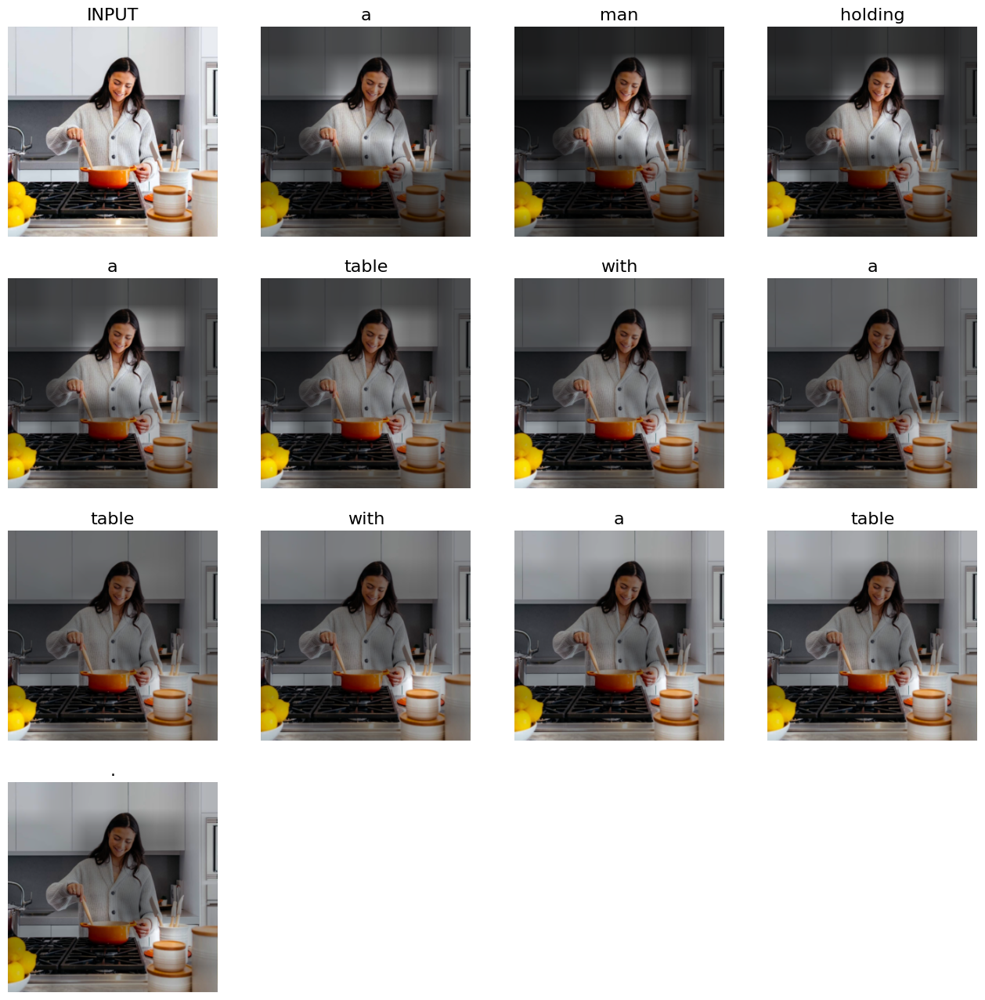

In [65]:
process_image(obtain_image(url="https://www.honestfoodtalks.com/wp-content/uploads/2021/11/Top-cooking-channels.jpeg"))

### Conclusion
Here is a place for your conclusions, observations, hypotheses, and any other feedback.

### Now what? (bonus part of the homework)

Your model produces some captions, but you still strive to improve it? You're damn right to do so. Here are some ideas that go beyond simply "stacking more layers".


### Byte pair encoding

As we've said, you don't want your network to predict a million-size vector of probabilities at each step, so we're gotta make some cuts.

The method for creating in vocabulary that we've used is to leave only the most frequently occurring words, but this will introduce an #UNK# token for the words that are not in the dictionary.

BPE will also allow us to have a dictionary of a fixed size, but will be able to process __ANY__ input word. We suggest using the [github implementation](https://github.com/rsennrich/subword-nmt) of the paper ["Neural Machine Translation of Rare Words with Subword Units"](https://arxiv.org/pdf/1508.07909.pdf).

Here is an example usage of a BPE encoder. To complete this part you will have to apply this encoder to the captions you've used, but mind the format, it accepts raw text, not json.

In [9]:
# bpe is done using subword-nmt package
#!pip install subword-nmt
!{sys.executable} -m pip install subword-nmt

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip available: 22.2.2 -> 22.3
[notice] To update, run: /Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip


In [10]:
example_text = """closeup of bins of food that include broccoli and bread .
a meal is presented in brightly colored plastic trays ."""

In [11]:
!echo "{example_text}" | subword-nmt get-vocab

of 2
. 2
closeup 1
bins 1
food 1
that 1
include 1
broccoli 1
and 1
bread 1
a 1
meal 1
is 1
presented 1
in 1
brightly 1
colored 1
plastic 1
trays 1


In [12]:
!echo "{example_text}" | subword-nmt learn-bpe --symbols 8 --verbose > example_codes.txt

  0%|                                                     | 0/8 [00:00<?, ?it/s]pair 0: r e -> re (frequency 3)
pair 1: s e -> se (frequency 2)
pair 2: o l -> ol (frequency 2)
pair 3: o f</w> -> of</w> (frequency 2)
pair 4: i n -> in (frequency 2)
pair 5: c ol -> col (frequency 2)
pair 6: c l -> cl (frequency 2)
pair 7: b r -> br (frequency 2)
100%|##########################################| 8/8 [00:00<00:00, 15384.88it/s]


note: \</w\> is an end-of-word marker. f\</w\> means that it is a token f that occurs exactly at the end of a word

The output of bpe learning is a list of rules of how to merge pairs of tokens

In [13]:
with open('example_codes.txt') as f:
    print(f.read())

#version: 0.2
r e
s e
o l
o f</w>
i n
c ol
c l
b r



In [14]:
tokens = !echo "{example_text}" | subword-nmt apply-bpe -c example_codes.txt
tokens

['cl@@ o@@ se@@ u@@ p of b@@ in@@ s of f@@ o@@ o@@ d t@@ h@@ a@@ t in@@ cl@@ u@@ d@@ e br@@ o@@ c@@ col@@ i a@@ n@@ d b@@ re@@ a@@ d .',
 'a m@@ e@@ a@@ l i@@ s p@@ re@@ se@@ n@@ t@@ e@@ d i@@ n br@@ i@@ g@@ h@@ t@@ l@@ y col@@ o@@ re@@ d p@@ l@@ a@@ s@@ t@@ i@@ c t@@ r@@ a@@ y@@ s .']


#### Attention
You can build better and more interpretable captioning model with attention over the generated part of the sentense.


#### Reinforcement learning
* After your model has been pre-trained in a teacher forced way, you can tune for captioning-speific models like CIDEr.
* Tutorial on RL for sequence models: [practical_rl week8](https://github.com/yandexdataschool/Practical_RL/tree/master/week8_scst)
* Theory: https://arxiv.org/abs/1612.00563